In [1]:
import tensorflow as tf
import numpy as np
import matplotlib.pyplot as plt
import seaborn as sns
import pandas as pd

import umap
from sklearn.datasets import fetch_openml

# In this assignment, you'll continue working with the fashion MNIST dataset. For the sake of comparability, use the same 10,0000-observation sample that you used in the previous checkpoint. To complete this assignment, submit a link to a Jupyter Notebook containing your solutions to the tasks outlined below. Plan on discussing your solutions with your mentor. You can also take a look at these example solutions.

# 1) Load the dataset and conduct any necessary preprocessing, such as normalizing the data.

* You can load the dataset using the fetch_openml function of sklearn.datasets as follows:

* mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

* Or, alternatively, you can download it from this link https://github.com/zalandoresearch/fashion-mnist and load it yourself.

In [2]:
mnist = fetch_openml('Fashion-MNIST', version=1, cache=True)

In [3]:
# mnist

In [4]:
data = mnist['data']
target = mnist['target']
feature_names = mnist['feature_names']
target_names = mnist['target_names']

In [5]:
data = pd.DataFrame(data)

In [6]:
target = pd.DataFrame(target)

In [7]:
data.columns = feature_names

In [8]:
target.columns = target_names

In [9]:
data.head()

,pixel1,pixel2,pixel3,pixel4,pixel5,pixel6,pixel7,pixel8,pixel9,pixel10,...,pixel775,pixel776,pixel777,pixel778,pixel779,pixel780,pixel781,pixel782,pixel783,pixel784
0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
1,0.0,0.0,0.0,0.0,0.0,1.0,0.0,0.0,0.0,0.0,...,119.0,114.0,130.0,76.0,0.0,0.0,0.0,0.0,0.0,0.0
2,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,22.0,...,0.0,0.0,1.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
3,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,33.0,96.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0
4,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,...,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0,0.0


In [10]:
target.head()

,class
0,9
1,0
2,0
3,3
4,0


In [11]:
data.isna().mean().sum()

0.0

In [12]:
target.isna().mean().sum()

0.0

# Randomly select 10,000 images, and work on this sample in the following exercises.

In [13]:
np.random.seed(66)

indices = np.random.choice(70000, 10000)
X = mnist['data'][indices] / 255.0
y = mnist['target'][indices]

print(X.shape, y.shape)

(10000, 784) (10000,)


# 2) Apply UMAP to the data.

In [15]:
umap_results = umap.UMAP(n_neighbors=5,
                          min_dist=0.3,
                          metric='correlation').fit_transform(X)

# 3) Using the two-dimensional UMAP representation, draw a graph of the data by coloring and labeling the data points as you did in the checkpoint.

In [16]:
plt.figure(figsize=(10, 5))
colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
for i in range(umap_results.shape[0]):
    plt.text(umap_results[i, 0], umap_results[i, 1], str(y[i]),
             color=colours[int(y[i])],
             fontdict={'weight': 'bold', 'size': 50}
        )

plt.xticks([])
plt.yticks([])
plt.axis('off')
plt.show()

# 4) Do you think that the UMAP solution is satisfactory? Can you easily distinguish between the different classes? Which algorithm produced better results, UMAP or the others (t-SNE or PCA) that you applied in the assignments from the previous checkpoints?

* UMAP seems to be the best of the clustering algorithms compared tp t-SNE and PCA
* Classes are clustered well and easy to distinguish

# 5) Now, play with the different hyperparameter values of the UMAP, and apply UMAP for each of them. Which combination is the best in terms of the two-dimensional representation clarity?

In [17]:
np.random.seed(66)

indices = np.random.choice(14000, 2000)
X = mnist['data'][indices] / 255.0
y = mnist['target'][indices]

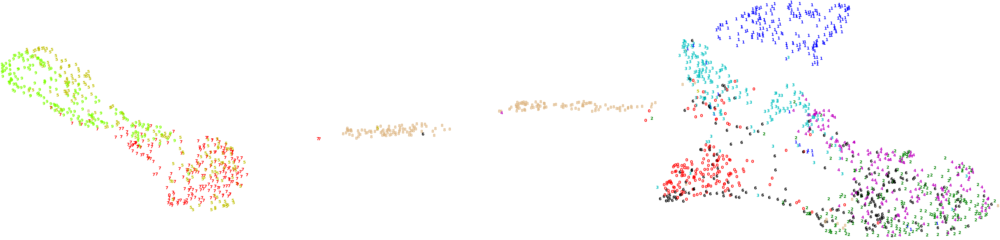

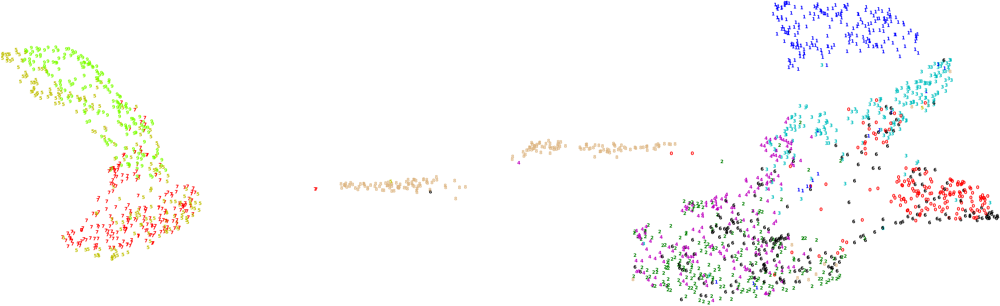

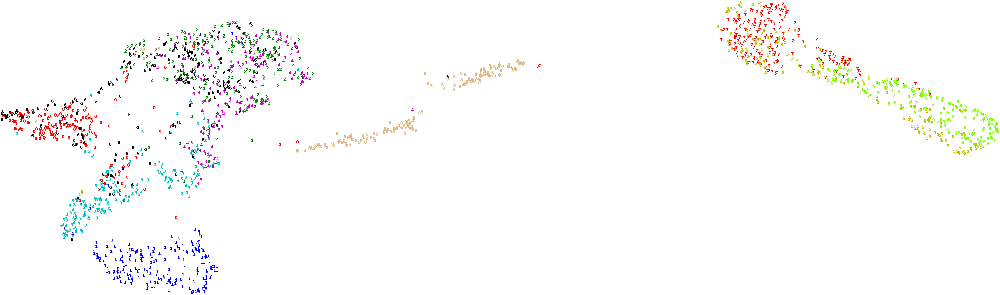

In [18]:
for neigh in range(30, 33, 1):
    umap_results = umap.UMAP(n_neighbors=neigh,
                              min_dist=0.3,
                              metric='correlation').fit_transform(X)
    
    plt.figure(figsize=(10, 5))
    colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
    for i in range(umap_results.shape[0]):
        plt.text(umap_results[i, 0], umap_results[i, 1], str(y[i]),
                 color=colours[int(y[i])],
                 fontdict={'weight': 'bold', 'size': 50}
            )

    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

# Best results with n_neighbors ~ 31

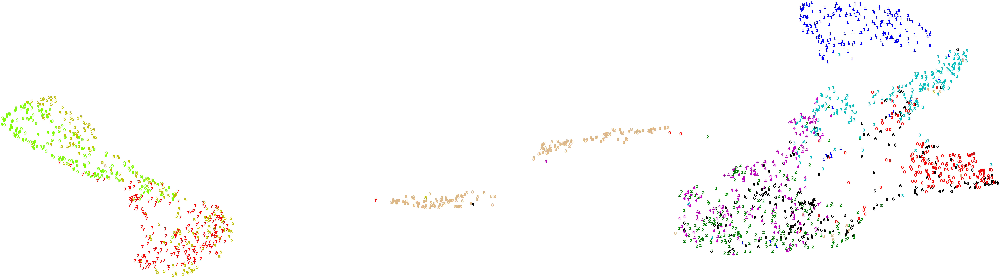

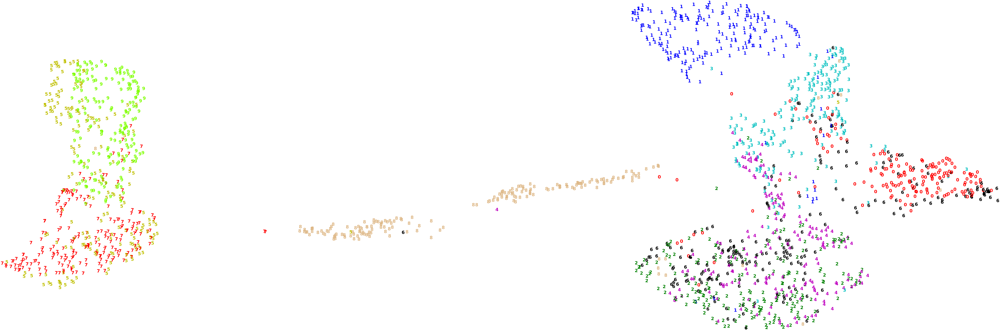

In [19]:
for dist in range(3, 7):
    umap_results = umap.UMAP(n_neighbors=31,
                              min_dist=(dist / 10),
                              metric='correlation').fit_transform(X)
    
    plt.figure(figsize=(10, 5))
    colours = ["r","b","g","c","m","y","k","r","burlywood","chartreuse"]
    for i in range(umap_results.shape[0]):
        plt.text(umap_results[i, 0], umap_results[i, 1], str(y[i]),
                 color=colours[int(y[i])],
                 fontdict={'weight': 'bold', 'size': 50}
            )

    plt.xticks([])
    plt.yticks([])
    plt.axis('off')
    plt.show()

### Best results with min_dist ~ 0.4